# Author

- Kevin Christian (https://www.linkedin.com/in/kevinchs0808/)

# Install Libraries

In [1]:
!pip3 install neo4j
!pip3 install networkx
!pip3 install pandas
!pip3 install tqdm
!pip3 install matplotlib
!pip3 install seaborn
!pip3 install neo4jupyter
!pip3 install scipy
!pip3 install secrets
#!pip install adtk

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
  Using cached secrets-1.0.2.tar.gz (7.9 kB)
  Preparing metadata (setup.py) ... error
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [13 lines of output]
      Traceback (most recent call last):
        File "/private/var/fol

# Import Libraries

In [2]:
from neo4j import GraphDatabase
import networkx as nx
import pandas as pd
import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import neo4jupyter
import secrets

# Start a Neo4j Docker Instance

## Docker Setup

If you do not have Docker Desktop in your computer, I would recommend you to download and setup the Docker Desktop using the instructions from https://www.docker.com/products/docker-desktop/

## Pull Neo4j Docker Image

- Open a terminal / command prompt
- type the following command in your terminal / command prompt: docker pull neo4j

## Start a new local instance

- type the following command in your terminal / command prompt: docker run --name (any-name) -p7474:7474 -p7687:7687 --env NEO4J_AUTH=(username)/(password) neo4j:latest
- Please replace (any-name), (username), (password); with any value that you want

# Neo4j Connection Class

In [3]:
class Neo4jConnection:
    ''' To create a connection with an active Neo4j Database Instance

    Attributes:
        __uri (str): The URL of the Neo4j Database Instance
        __user (str): The username of the Neo4j Database Instance owner
        __pwd (str): The password of the Neo4j Database Instance owner
        __driver (neo4j.GraphDatabase): The Neo4j Database Instance

    Methods:
        __init__(uri, user, pwd): To create the Neo4jConnection Class
        close(): To close the Neo4j Database Connection
        query(query: str, parameters=None, db=None): To perform analytics on the Neo4j Graph Database Instance based on the query and parameters the user provides
    
    '''
    
    def __init__(self, uri: str, user: str, pwd: str) -> None:
        ''' To create the Neo4jConnection Class

        Args:
            uri (str): The URL of the Neo4j Database Instance
            user (str): The username of the Neo4j Database Instance owner
            pwd (str): The password of the Neo4j Database Instance owner
            
        Returns:
            None
            
        '''
        
        self.__uri = uri
        self.__user = user
        self.__pwd = pwd
        self.__driver = None

        # Try to initialize the Neo4j Database Instance
        try:
            self.__driver = GraphDatabase.driver(self.__uri, auth=(self.__user, self.__pwd))

        # If it does not work, throw an error
        except Exception as e:
            print("Failed to create the driver:", e)
        
    def close(self) -> None:
        ''' To close the Neo4j Database Connection

        Args:
            None

        Returns:
            None
            
        '''

        # Close the driver if it is active
        if self.__driver is not None:
            self.__driver.close()
        
    def query(self, query: str, parameters: dict = None, db: str = None):
        ''' To perform analytics on the Neo4j Graph Database Instance based on the query and parameters the user provides

        Args:
            query (str): The Cypher instructions for obtaining the requested information
            parameters (dict): The set of supporting information for achieving the query result
            db (str): The database name

        Returns:
            None
            
        '''

        # Make sure that the Neo4j Driver has been initialized
        assert self.__driver is not None, "Driver not initialized!"
        session = None
        response = None

        # Try to get the querying result
        try: 
            session = self.__driver.session(database=db) if db is not None else self.__driver.session() 
            response = list(session.run(query, parameters))

        # If it failed, throw an error
        except Exception as e:
            print("Query failed:", e)

        # Always close the session's connection regardless of the querying result
        finally: 
            if session is not None:
                session.close()
                
        return response

# Create A New Connection to a Neo4j Docker Instance

In [4]:
conn = Neo4jConnection(uri="bolt://0.0.0.0:7687", 
                       user="neo4j",              
                       pwd="12345678")

# Import The Dataset

In [5]:
##################################################################################################################################################################################################################
# CREDIT:
#   - S. Kumar, F. Spezzano, V.S. Subrahmanian, C. Faloutsos. Edge Weight Prediction in Weighted Signed Networks. IEEE International Conference on Data Mining (ICDM), 2016.
#   - S. Kumar, B. Hooi, D. Makhija, M. Kumar, V.S. Subrahmanian, C. Faloutsos. REV2: Fraudulent User Prediction in Rating Platforms. 11th ACM International Conference on Web Searchand Data Mining (WSDM), 2018.
##################################################################################################################################################################################################################

file = "./soc-sign-bitcoinalpha.csv.gz"

df = pd.read_csv(file, compression='gzip', names = ["SOURCE", "TARGET", "RATING", "TIME"], header=None)

df["TIME"] = pd.to_datetime(df["TIME"], unit='s')

df["TIME"] = df["TIME"].dt.strftime('%Y-%m-%d')

df = df.sort_values(by='TIME') 

df.head()

,SOURCE,TARGET,RATING,TIME
1276,2,402,1,2010-11-08
10469,113,54,4,2010-11-08
4004,10,970,8,2010-11-08
4005,10,271,8,2010-11-08
10468,119,54,5,2010-11-10


In [6]:
## Earliest Date

In [7]:
df['TIME'].min()

'2010-11-08'

In [8]:
## Latest Date

In [9]:
df['TIME'].max()

'2016-01-22'

# Define The Node Constraint

In [10]:
conn.query('CREATE CONSTRAINT users IF NOT EXISTS FOR (u:User) REQUIRE u.id IS UNIQUE')

[]

# Define Functions for Adding Nodes + Edges

In [11]:
def add_source(records):
    # Adds source nodes to the Neo4j graph.
  
    query = '''UNWIND $rows AS row
    MERGE (source:User {id: row.SOURCE})
    RETURN count(*)
    '''
    
    return conn.query(query, parameters={'rows': records.to_dict('records')})

def add_target(records):
    # Adds target nodes to the Neo4j graph.
  
    query = '''UNWIND $rows AS row
    MERGE (target:User {id: row.TARGET})
    RETURN count(*)
    '''
    
    return conn.query(query, parameters={'rows': records.to_dict('records')})

def add_trust_edge(records):
    # Adds directed and weighted ratings from (source to target) to the Neo4j graph.
  
    query = '''UNWIND $rows AS row
    MATCH (source:User {id: row.SOURCE})
    MATCH (target:User {id: row.TARGET})
    MERGE (source)-[:TRUST {weight: toInteger(row.RATING)}]->(target)
    RETURN count(*)
    '''
    
    return conn.query(query, parameters={'rows': records.to_dict('records')})

# Add Nodes + Edges

In [12]:
add_source(df)

[<Record count(*)=24186>]

In [13]:
add_target(df)

[<Record count(*)=24186>]

In [14]:
add_trust_edge(df)

[<Record count(*)=24186>]

# Potential Trustworthy Users (Naive Method)

At first glance, the easiest way to find the most trustworthy users is to find those users who have the highest average of received ratings. However, what if some users deliberately assign false ratings to make it harder for fraud detection?

In [15]:
trustworthy_string = '''
MATCH (c:User) 
MATCH ()-[r]->(c)
RETURN c.id, avg(r.weight) AS Trust_Value
ORDER BY Trust_Value DESC LIMIT 100
'''

trustworthy_df = pd.DataFrame([dict(_) for _ in conn.query(trustworthy_string)])
trustworthy_df.head(100)

,c.id,Trust_Value
0,827,10.000000
1,414,10.000000
2,797,10.000000
3,836,10.000000
4,828,10.000000
...,...,...
95,387,5.250000
96,160,5.222222
97,1229,5.000000
98,1306,5.000000


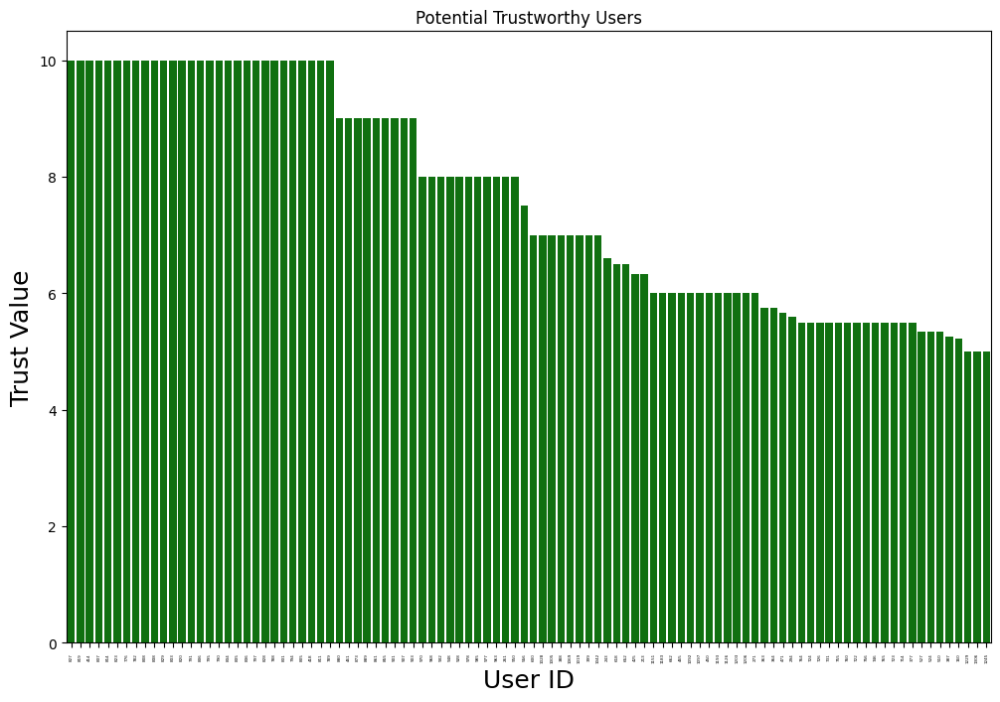

In [16]:
plt.figure(figsize=(12,8))
sns.barplot(x=trustworthy_df['c.id'], y=trustworthy_df['Trust_Value'], color='green', order=trustworthy_df.sort_values(by=['Trust_Value'], ascending=False).set_index('c.id').index)
plt.xlabel('User ID', fontsize=18)
plt.ylabel('Trust Value',fontsize=18)
plt.xticks(rotation='vertical', fontsize=3)
plt.title("Potential Trustworthy Users")
plt.show()

# Potential Fraudulent User (Naive Method)

At first glance, the easiest way to find the most fraudulent users is to find those users who have the lowest average of received ratings. However, what if some users deliberately assign false ratings to make it harder for fraud detection?

In [17]:
fraudulent_string = '''
MATCH (c:User) 
MATCH ()-[r]->(c)
RETURN c.id, avg(r.weight) AS Trust_Value
ORDER BY Trust_Value LIMIT 100
'''

fraudulent_df = pd.DataFrame([dict(_) for _ in conn.query(fraudulent_string)])
fraudulent_df.head(100)

,c.id,Trust_Value
0,7478,-10.000000
1,7545,-10.000000
2,7458,-10.000000
3,7448,-10.000000
4,7456,-10.000000
...,...,...
95,7493,-5.500000
96,7490,-5.500000
97,7583,-5.250000
98,7576,-5.166667


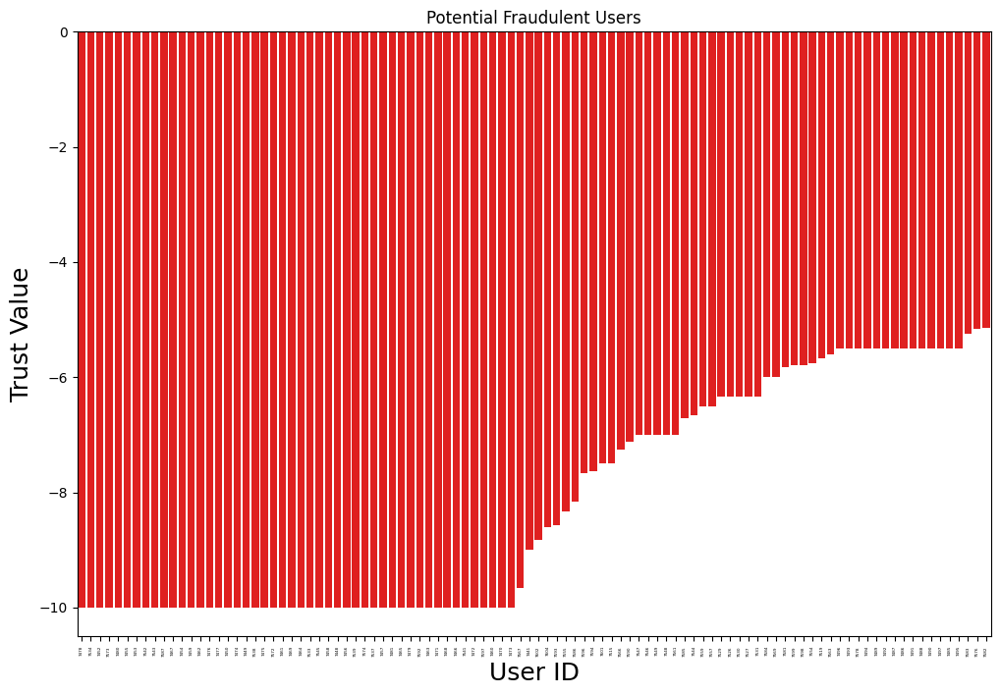

In [18]:
plt.figure(figsize=(12,8))
sns.barplot(x=fraudulent_df['c.id'], y=fraudulent_df['Trust_Value'], color='red', order=fraudulent_df.sort_values(by=['Trust_Value'], ascending=True).set_index('c.id').index)
plt.xlabel('User ID', fontsize=18)
plt.ylabel('Trust Value',fontsize=18)
plt.xticks(rotation='vertical', fontsize=3)
plt.title("Potential Fraudulent Users")
plt.show()

# Overall Visualization

Well, the following visualization shows all users that we have, along with how they rate each other. Even though it looks appealing, but it does not convey any insights.

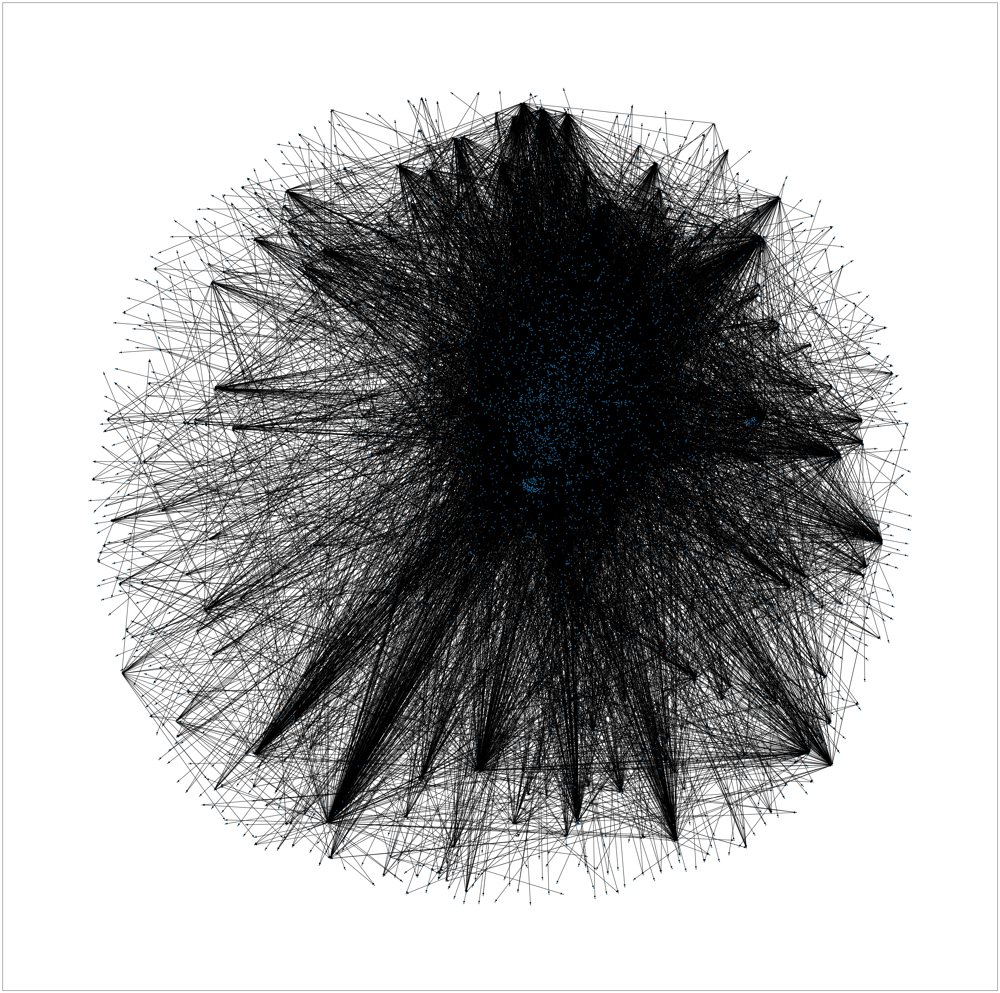

In [19]:
overall_graph = nx.DiGraph(directed=True)

plt.figure(figsize=(50,50))

for i in range(df.shape[0]):
    source = df.loc[i, "SOURCE"]
    target = df.loc[i, "TARGET"]
    weight = df.loc[i, "RATING"]
    overall_graph.add_edges_from([(source, target)], weight=weight)

nx.draw_networkx(overall_graph, arrows=True, node_size=5,font_size=1)

plt.show()

# Anomaly Detection Function (IN PROGRESS)

In [20]:
def anomaly_plot(df, date_column, factor, yvar):
    df = df.set_index(date_column)
    s = validate_series(df[yvar])
    seasonal_ad = SeasonalAD(c=3.0, side="both")
    anomalies = seasonal_ad.fit_detect(s)
    plot(s, anomaly=anomalies, ts_markersize=1, anomaly_color='red', anomaly_tag="marker", anomaly_markersize=2);

def each_factor_anomaly_detection(s, date_column, yvar):
    df = df.set_index(date_column)
    s = validate_series(df[yvar])
    seasonal_ad = SeasonalAD(c=3.0, side="both")
    anomalies = seasonal_ad.fit_detect(s)
    if len(anomalies) > 0:
        df['has_outlier'] = True
    else:
        df['has_outlier'] = False

    return df

def anomaly_detection(df, date_column, factor, yvar):
    result = df.groupby([date_column, factor]).apply(each_factor_anomaly_detection, date_column=date_column, yvar=yvar).reset_index()
    has_outlier_df = result[[factor, "has_outlier"]].drop_duplicates()

    return result, has_outlier_df

# The number of received ratings of each user

## Users with highest number of received ratings

In [21]:
highest_count_of_received_ratings_string = '''
MATCH (c:User) 
MATCH ()-[r]->(c)
RETURN c.id, count(r) AS Received_Ratings_Count
ORDER BY Received_Ratings_Count DESC LIMIT 20
'''

highest_count_of_received_ratings_df = pd.DataFrame([dict(_) for _ in conn.query(highest_count_of_received_ratings_string)])
highest_count_of_received_ratings_df.head(20)

,c.id,Received_Ratings_Count
0,1,398
1,3,251
2,2,205
3,11,203
4,4,201
5,177,198
6,7,195
7,10,164
8,5,146
9,6,139


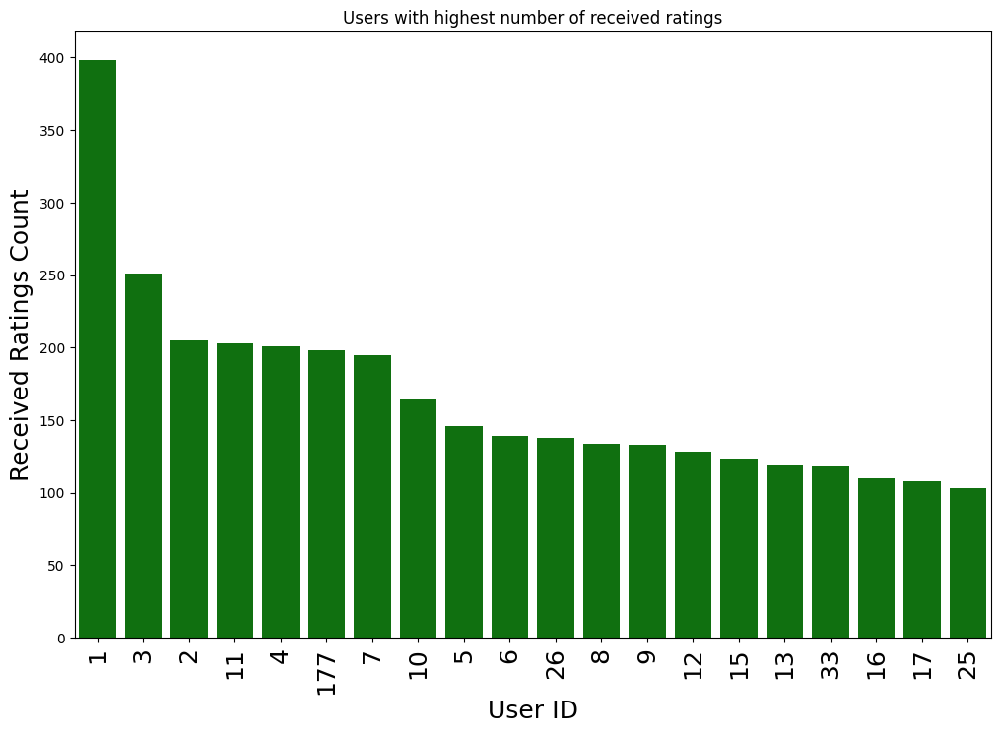

In [22]:
plt.figure(figsize=(12,8))
sns.barplot(x=highest_count_of_received_ratings_df['c.id'], y=highest_count_of_received_ratings_df['Received_Ratings_Count'], color='green', order=highest_count_of_received_ratings_df.sort_values(by=['Received_Ratings_Count'], ascending=False).set_index('c.id').index)
plt.xlabel('User ID', fontsize=18)
plt.ylabel('Received Ratings Count',fontsize=18)
plt.xticks(rotation='vertical', fontsize=18)
plt.title("Users with highest number of received ratings")
plt.show()

## Users with lowest number of received ratings

In [23]:
lowest_count_of_received_ratings_string = '''
MATCH (c:User) 
MATCH ()-[r]->(c)
RETURN c.id, count(r) AS Received_Ratings_Count
ORDER BY Received_Ratings_Count LIMIT 20
'''

lowest_count_of_received_ratings_df = pd.DataFrame([dict(_) for _ in conn.query(lowest_count_of_received_ratings_string)])
lowest_count_of_received_ratings_df.head(20)

,c.id,Received_Ratings_Count
0,2448,1
1,2453,1
2,1602,1
3,2443,1
4,2442,1
5,2450,1
6,2440,1
7,1911,1
8,2446,1
9,2447,1


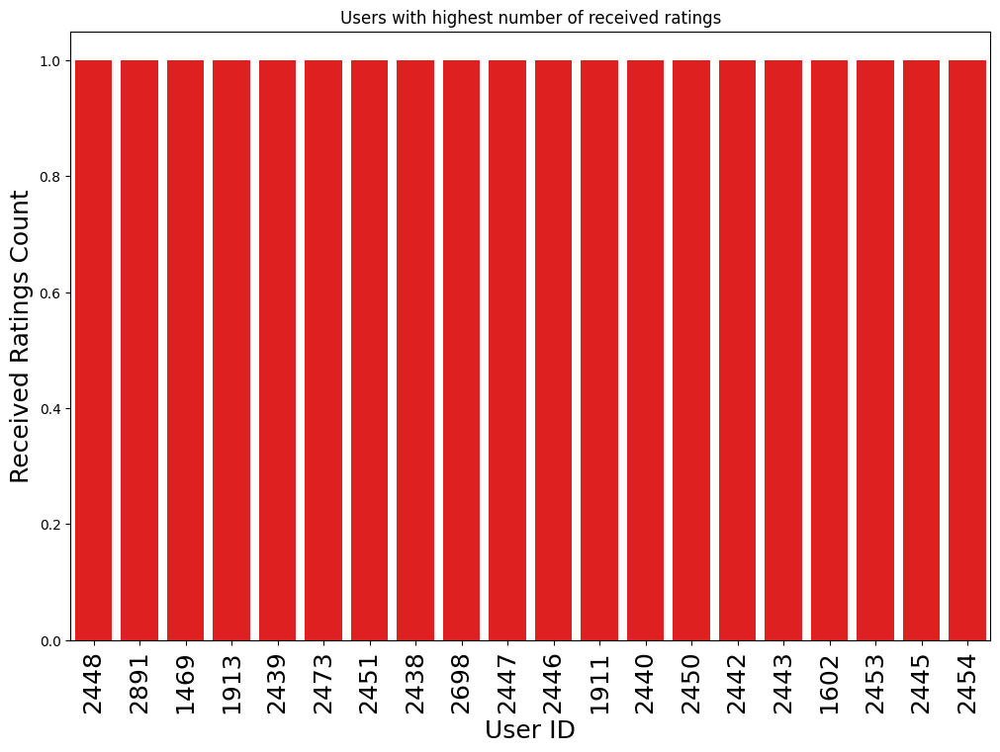

In [24]:
plt.figure(figsize=(12,8))
sns.barplot(x=lowest_count_of_received_ratings_df['c.id'], y=lowest_count_of_received_ratings_df['Received_Ratings_Count'], color='red', order=lowest_count_of_received_ratings_df.sort_values(by=['Received_Ratings_Count'], ascending=True).set_index('c.id').index)
plt.xlabel('User ID', fontsize=18)
plt.ylabel('Received Ratings Count',fontsize=18)
plt.xticks(rotation='vertical', fontsize=18)
plt.title("Users with highest number of received ratings")
plt.show()

## Anomaly Detection on the fluctuation of the number of received ratings over time

In [25]:
#TODO

## Some Examples of Users that have anomalies

In [26]:
#TODO

# The number of ratings each user give

## Users who most frequently rate others

In [27]:
highest_count_of_ratings_given_string = '''
MATCH (c:User) 
MATCH (c)-[r]->()
RETURN c.id, count(r) AS Ratings_Given_Count
ORDER BY Ratings_Given_Count DESC LIMIT 20
'''

highest_count_of_ratings_given_df = pd.DataFrame([dict(_) for _ in conn.query(highest_count_of_ratings_given_string)])
highest_count_of_ratings_given_df.head(20)

,c.id,Ratings_Given_Count
0,1,490
1,8,259
2,3,243
3,4,215
4,7,212
5,11,203
6,177,202
7,15,197
8,2,195
9,10,177


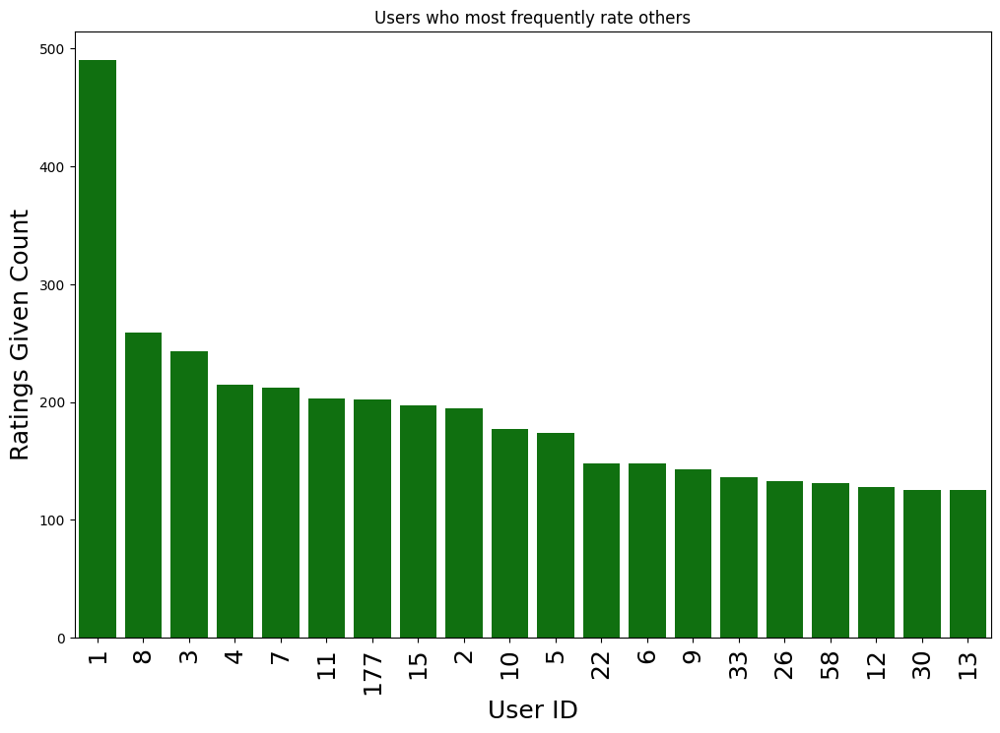

In [28]:
plt.figure(figsize=(12,8))
sns.barplot(x=highest_count_of_ratings_given_df['c.id'], y=highest_count_of_ratings_given_df['Ratings_Given_Count'], color='green', order=highest_count_of_ratings_given_df.sort_values(by=['Ratings_Given_Count'], ascending=False).set_index('c.id').index)
plt.xlabel('User ID', fontsize=18)
plt.ylabel('Ratings Given Count',fontsize=18)
plt.xticks(rotation='vertical', fontsize=18)
plt.title("Users who most frequently rate others")
plt.show()

## Users who least frequently rate others

In [29]:
lowest_count_of_ratings_given_string = '''
MATCH (c:User) 
MATCH (c)-[r]->()
RETURN c.id, count(r) AS Ratings_Given_Count
ORDER BY Ratings_Given_Count LIMIT 20
'''

lowest_count_of_ratings_given_df = pd.DataFrame([dict(_) for _ in conn.query(lowest_count_of_ratings_given_string)])
lowest_count_of_ratings_given_df.head(20)

,c.id,Ratings_Given_Count
0,1602,1
1,2445,1
2,2442,1
3,1080,1
4,626,1
5,1214,1
6,2439,1
7,2440,1
8,1910,1
9,1911,1


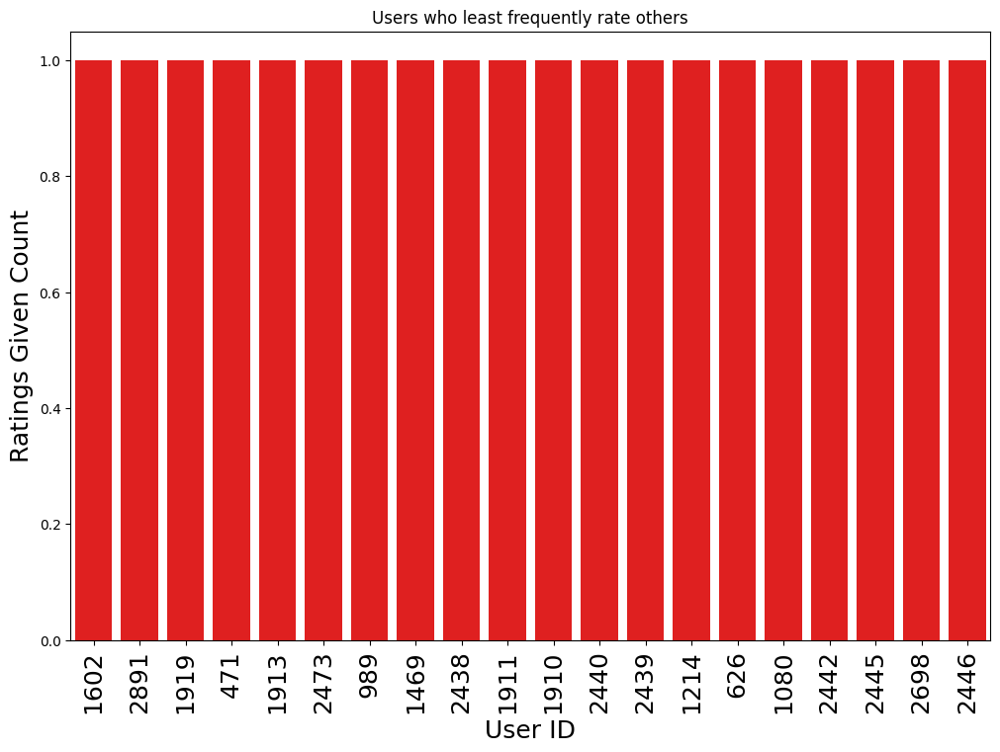

In [30]:
plt.figure(figsize=(12,8))
sns.barplot(x=lowest_count_of_ratings_given_df['c.id'], y=lowest_count_of_ratings_given_df['Ratings_Given_Count'], color='red', order=lowest_count_of_ratings_given_df.sort_values(by=['Ratings_Given_Count'], ascending=True).set_index('c.id').index)
plt.xlabel('User ID', fontsize=18)
plt.ylabel('Ratings Given Count',fontsize=18)
plt.xticks(rotation='vertical', fontsize=18)
plt.title("Users who least frequently rate others")
plt.show()

## Anomaly Detection on the fluctuation of the number of ratings given over time

In [31]:
#TODO

## Some Examples of Users that have anomalies

In [32]:
#TODO

# Average Rating of each user over time

In [33]:
#TODO

## Anomaly Detection

In [34]:
#TODO

## Some Examples of Users that have anomalies

In [35]:
#TODO

# Community Detection

As you can see from the overall visualization, it may be hard to find out who may be fraudulent. Hence, let's try to understand how we can divide the large network into several clusters, by using multiple methods.

## Graph Catalog Initialization

This operation is compulsory before you can use any of the Neo4j's graph data science functions

In [36]:
modularity_optimization_graph_catalog_string = '''
CALL gds.graph.project(
    'ModularityOptimizationGraph',
    'User',
    'TRUST',
    {
        relationshipProperties: 'weight'
    }
)
'''

label_propagation_graph_catalog_string = '''
CALL gds.graph.project(
    'LabelPropagationGraph',
    'User',
    'TRUST',
    {
        relationshipProperties: 'weight'
    }
)
'''

louvain_graph_catalog_string = '''
CALL gds.graph.project(
    'LouvainGraph',
    'User',
    'TRUST',
    {
        relationshipProperties: 'weight'
    }
)
'''

conn.query(modularity_optimization_graph_catalog_string)
conn.query(label_propagation_graph_catalog_string)
conn.query(louvain_graph_catalog_string)

[<Record nodeProjection={'User': {'label': 'User', 'properties': {}}} relationshipProjection={'TRUST': {'aggregation': 'DEFAULT', 'orientation': 'NATURAL', 'indexInverse': False, 'properties': {'weight': {'aggregation': 'DEFAULT', 'property': 'weight', 'defaultValue': None}}, 'type': 'TRUST'}} graphName='LouvainGraph' nodeCount=3783 relationshipCount=24186 projectMillis=22>]

## Clustering Performance Metric: Conductance

By using conductance on a community, we would like to minimize the ratio between the number of connection pointing outwards the community compared to the number of connections that exist within the community.

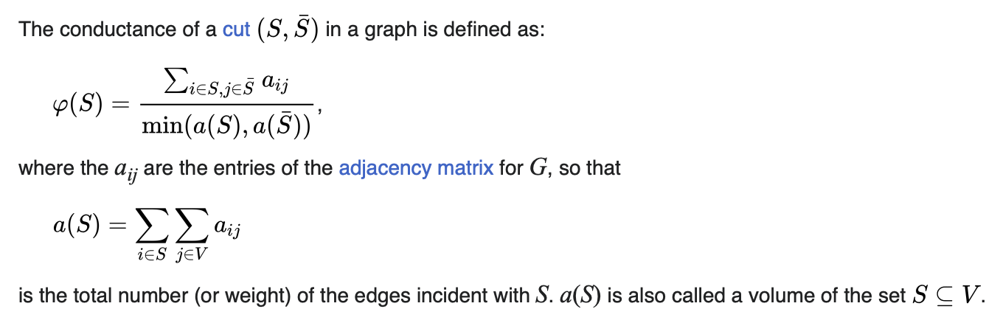

Credit: Wikipedia

## Random Color Generator

This function will be useful to create a dynamic node color mapping for the network clustering visualization

In [37]:
def random_color_generator():
    r = secrets.randbelow(256)
    g = secrets.randbelow(256)
    b = secrets.randbelow(256)
    return (r, g, b)

def community_color_generator(communities):
    result = {}
    for i in range(len(communities)):
        while True:
            new_color = random_color_generator()
            if new_color not in result.keys():
                result[communities[i]] = new_color
    return result

## Modularity Optimization

The aim of this clustering method is to find out a set of communities out of a large network, such that each network can maximize the number of relationships within the community itself, while minimizing the number of connection pointing outwards from the community. It will use random node partitions (not exhaustive to minimize the resource usage) and then find out which partition will ensure that the modularity score can be optimized in each community. Some examples of the partitions selection can be local search methods, greedy algorithms, or other heuristic approaches

In [38]:
modularity_optimization_mutate_string = '''
CALL gds.modularityOptimization.mutate('ModularityOptimizationGraph', { mutateProperty: 'modularity_optimization_community', relationshipWeightProperty: 'weight' })
YIELD communityCount
'''

print(conn.query(modularity_optimization_mutate_string))

modularity_optimization_stream_string = '''
CALL gds.modularityOptimization.stream('ModularityOptimizationGraph', { relationshipWeightProperty: 'weight' })
YIELD nodeId, communityId
RETURN nodeId AS user_id, communityId AS community_id
'''

modularity_optimization_df = pd.DataFrame([dict(_) for _ in conn.query(modularity_optimization_stream_string)])
print(len(modularity_optimization_df['community_id'].unique()))

[<Record communityCount=817>]
830


### Conductance Metric

In [39]:
modularity_optimization_conductance_metric_string = '''
CALL gds.conductance.stream('ModularityOptimizationGraph', { communityProperty: 'modularity_optimization_community', relationshipWeightProperty: 'weight' })
YIELD community, conductance
RETURN community AS modularity_optimization_community, conductance
'''

modularity_optimization_conductance_metrics_df = pd.DataFrame([dict(_) for _ in conn.query(modularity_optimization_conductance_metric_string)])
print(modularity_optimization_conductance_metrics_df['conductance'].mean())

0.4574784929795318


### Network + Clusters Visualization

In [40]:
# NEED OPTIMIZATION, NOT A PRIORITY FOR NOW

'''
current_cluster_df = modularity_optimization_df

communities = current_cluster_df['community_id'].unique()

G = nx.DiGraph(directed=True)

plt.figure(figsize=(50,50))

for i in range(df.shape[0]):
    source = df.loc[i, "SOURCE"]
    target = df.loc[i, "TARGET"]
    weight = df.loc[i, "RATING"]
    G.add_edges_from([(source, target)], weight=weight)

community_to_color = community_color_generator(communities)

node_color = {current_cluster_df.loc[i, 'user_id']: community_to_color[current_cluster_df.loc[i, 'community_id']] for i in current_cluster_df.shape[0]}

nx.draw_networkx(G, arrows=True, node_color=node_color, node_size=10,font_size=1)

plt.show()
'''

'\ncurrent_cluster_df = modularity_optimization_df\n\ncommunities = current_cluster_df[\'community_id\'].unique()\n\nG = nx.DiGraph(directed=True)\n\nplt.figure(figsize=(50,50))\n\nfor i in range(df.shape[0]):\n    source = df.loc[i, "SOURCE"]\n    target = df.loc[i, "TARGET"]\n    weight = df.loc[i, "RATING"]\n    G.add_edges_from([(source, target)], weight=weight)\n\ncommunity_to_color = community_color_generator(communities)\n\nnode_color = {current_cluster_df.loc[i, \'user_id\']: community_to_color[current_cluster_df.loc[i, \'community_id\']] for i in current_cluster_df.shape[0]}\n\nnx.draw_networkx(G, arrows=True, node_color=node_color, node_size=10,font_size=1)\n\nplt.show()\n'

## Label propagation

In this method, every node will first be given a label. Then, within each iteration of the process, each node will update its label based on the majority label of its neigbours. If there's no majority label or there's a tie, then it will be arbitrarily broken, but deterministically. For example, it can use the nearest neghbour (weighted edge) or label's weight (the number of nodes in the whole network that has the label)

In [41]:
label_propagation_mutate_string = '''
CALL gds.labelPropagation.mutate('LabelPropagationGraph', { mutateProperty: 'label_propagation_community', relationshipWeightProperty: 'weight' })
YIELD communityCount
'''

print(conn.query(label_propagation_mutate_string))

label_propagation_stream_string = '''
CALL gds.labelPropagation.stream('LabelPropagationGraph', { relationshipWeightProperty: 'weight' })
YIELD nodeId, communityId
RETURN nodeId AS user_id, communityId AS community_id
'''

label_propagation_df = pd.DataFrame([dict(_) for _ in conn.query(label_propagation_stream_string)])
print(len(label_propagation_df['community_id'].unique()))

[<Record communityCount=561>]
561


### Conductance Metric

In [42]:
label_propagation_conductance_metric_string = '''
CALL gds.conductance.stream('LabelPropagationGraph', { communityProperty: 'label_propagation_community', relationshipWeightProperty: 'weight' })
YIELD community, conductance
RETURN community AS label_propagation_community, conductance
'''

label_propagation_conductance_metrics_df = pd.DataFrame([dict(_) for _ in conn.query(label_propagation_conductance_metric_string)])
print(label_propagation_conductance_metrics_df['conductance'].mean())

-inf


### Network + Clusters Visualization

In [43]:
# NEED OPTIMIZATION, NOT A PRIORITY FOR NOW

'''
current_cluster_df = label_propagation_df

communities = current_cluster_df['community_id'].unique()

G = nx.DiGraph(directed=True)

plt.figure(figsize=(50,50))

for i in range(df.shape[0]):
    source = df.loc[i, "SOURCE"]
    target = df.loc[i, "TARGET"]
    weight = df.loc[i, "RATING"]
    G.add_edges_from([(source, target)], weight=weight)

community_to_color = community_color_generator(communities)

node_color = {current_cluster_df.loc[i, 'user_id']: community_to_color[current_cluster_df.loc[i, 'community_id']] for i in current_cluster_df.shape[0]}

nx.draw_networkx(G, arrows=True, node_color=node_color, node_size=10,font_size=1)

plt.show()
'''

'\ncurrent_cluster_df = label_propagation_df\n\ncommunities = current_cluster_df[\'community_id\'].unique()\n\nG = nx.DiGraph(directed=True)\n\nplt.figure(figsize=(50,50))\n\nfor i in range(df.shape[0]):\n    source = df.loc[i, "SOURCE"]\n    target = df.loc[i, "TARGET"]\n    weight = df.loc[i, "RATING"]\n    G.add_edges_from([(source, target)], weight=weight)\n\ncommunity_to_color = community_color_generator(communities)\n\nnode_color = {current_cluster_df.loc[i, \'user_id\']: community_to_color[current_cluster_df.loc[i, \'community_id\']] for i in current_cluster_df.shape[0]}\n\nnx.draw_networkx(G, arrows=True, node_color=node_color, node_size=10,font_size=1)\n\nplt.show()\n'

## Louvain

In Louvain method, it also uses the Modularity Optimization concept. But in this case, the partition method is clear. So, in the first stage, each node will be considered as a unique community. Then in each round of this clustering method, there will be multiple node merging operations where the merging only happens when the modularity score of every community is improved. The process will stop when the modularity score cannot be improved anymore or if it reach the maximum number of iterations that the user specified.

In [44]:
louvain_mutate_string = '''
CALL gds.louvain.mutate('LouvainGraph', { mutateProperty: 'louvain_community', relationshipWeightProperty: 'weight' })
YIELD communityCount
'''

print(conn.query(louvain_mutate_string))

louvain_stream_string = '''
CALL gds.louvain.stream('LouvainGraph', { relationshipWeightProperty: 'weight' })
YIELD nodeId, communityId
RETURN nodeId AS user_id, communityId AS community_id
'''

louvain_df = pd.DataFrame([dict(_) for _ in conn.query(louvain_stream_string)])
print(len(louvain_df['community_id'].unique()))

[<Record communityCount=394>]
406


### Conductance Metric

In [45]:
louvain_conductance_metric_string = '''
CALL gds.conductance.stream('LouvainGraph', { communityProperty: 'louvain_community', relationshipWeightProperty: 'weight' })
YIELD community, conductance
RETURN community AS louvain_community, conductance
'''

louvain_conductance_metrics_df = pd.DataFrame([dict(_) for _ in conn.query(louvain_conductance_metric_string)])
print(louvain_conductance_metrics_df['conductance'].mean())

0.32029975783517767


### Network + Clusters Visualization

In [46]:
# NEED OPTIMIZATION, NOT A PRIORITY FOR NOW

'''
current_cluster_df = louvain_df

communities = current_cluster_df['community_id'].unique()

G = nx.DiGraph(directed=True)

plt.figure(figsize=(50,50))

for i in range(df.shape[0]):
    source = df.loc[i, "SOURCE"]
    target = df.loc[i, "TARGET"]
    weight = df.loc[i, "RATING"]
    G.add_edges_from([(source, target)], weight=weight)

community_to_color = community_color_generator(communities)

node_color = {current_cluster_df.loc[i, 'user_id']: community_to_color[current_cluster_df.loc[i, 'community_id']] for i in current_cluster_df.shape[0]}

nx.draw_networkx(G, arrows=True, node_color=node_color, node_size=10,font_size=1)

plt.show()
'''

'\ncurrent_cluster_df = louvain_df\n\ncommunities = current_cluster_df[\'community_id\'].unique()\n\nG = nx.DiGraph(directed=True)\n\nplt.figure(figsize=(50,50))\n\nfor i in range(df.shape[0]):\n    source = df.loc[i, "SOURCE"]\n    target = df.loc[i, "TARGET"]\n    weight = df.loc[i, "RATING"]\n    G.add_edges_from([(source, target)], weight=weight)\n\ncommunity_to_color = community_color_generator(communities)\n\nnode_color = {current_cluster_df.loc[i, \'user_id\']: community_to_color[current_cluster_df.loc[i, \'community_id\']] for i in current_cluster_df.shape[0]}\n\nnx.draw_networkx(G, arrows=True, node_color=node_color, node_size=10,font_size=1)\n\nplt.show()\n'

## Conclusion on Community Detection

Based on the community detection methods that we have tested, it seems that Louvain here is the best method as it has the lowest define conductance value. Even though

In [47]:
best_community_df = louvain_df

# Machine Learning Models using Graph Embeddings

## Feature Engineering on each Node

To improve the ability of the machine learning models to predict better, we firstly need to perform some feature engineering on the data that we have.

### Fairness & Goodness of Nodes

There are 2 metrics that we will use to assess how good a user is, which are fairness and goodness. Fairness refers to how fair a user rate other users. While goodness refers to how good a user is through the ratings that he / she received, which are weighted by the fairness of the raters.

Credit: S. Kumar, F. Spezzano, V.S. Subrahmanian, C. Faloutsos. Edge Weight Prediction in Weighted Signed Networks. IEEE International Conference on Data Mining (ICDM), 2016.

### Fairness

From the formula below, you can see that a user has low fairness when he/she frequently rate others with values that are very different from his / her own goodness. 

- out(u) indicates the set of nodes u in which the node v give ratings to.
- W(u, v) indicates the ratings in which node v gives to node u.
- g(v) indicates the goodness of node v.
- R indicates the range of the ratings (W_max - W_min).
- |out(u)| indicates the number of nodes u in which the node v give ratings to.

Since the rating can be between -10 and 10, R = 20 in this case

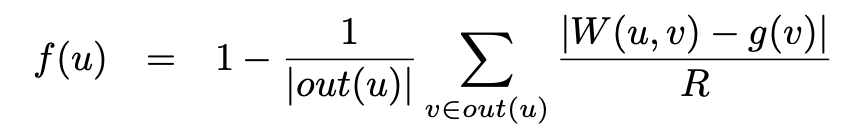

### Goodness

Goodness can be thought as the weighted average of the ratings that are received, where the weights are the fairness of the raters.

- in(u) indicates the set of nodes u in which give ratings to node v.
- W(u, v) indicates the ratings in which node u gives to node v.
- f(u) indicates the fairness of node u.
- |in(u)| indicates the number of nodes u in which give ratings to node v.

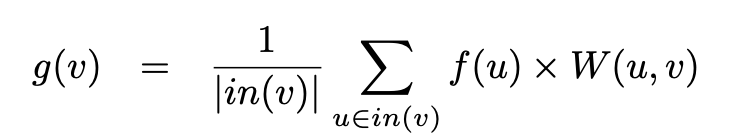

### Algorithm

In [48]:
'''
Code for the paper:
Edge Weight Prediction in Weighted Signed Networks. 
Conference: ICDM 2016
Authors: Srijan Kumar, Francesca Spezzano, VS Subrahmanian and Christos Faloutsos

Author of code: Srijan Kumar
Email of code author: srijan@cs.stanford.edu
'''

import networkx as nx
import math

def initialize_scores(G):
    fairness = {}
    goodness = {}
    
    nodes = G.nodes()
    for node in nodes:
        fairness[node] = 1
        try:
            goodness[node] = G.in_degree(node, weight='weight')*1.0/G.in_degree(node)
        except:
            goodness[node] = 0
    return fairness, goodness

def compute_fairness_goodness(G):
    max_range = 20
    fairness, goodness = initialize_scores(G)
    
    nodes = G.nodes()
    iter = 0
    while iter < 100:
        df = 0
        dg = 0

        print('-----------------')
        print("Iteration number", iter)
        
        print('Updating goodness')
        for node in nodes:
            inedges = G.in_edges(node, data='weight')
            g = 0
            for edge in inedges:
                print(edge)
                g += fairness[edge[0]]*edge[2]

            try:
                dg += abs(g/len(inedges) - goodness[node])
                goodness[node] = g/len(inedges)
            except:
                pass

        print('Updating fairness')
        for node in nodes:
            outedges = G.out_edges(node, data='weight')
            f = 0
            for edge in outedges:
                f += 1.0 - abs(edge[2] - goodness[edge[1]])/max_range
            try:
                df += abs(f/len(outedges) - fairness[node])
                fairness[node] = f/len(outedges)
            except:
                pass
        
        print('Differences in fairness score and goodness score = %.2f, %.2f' % (df, dg))
        if df < math.pow(10, -6) and dg < math.pow(10, -6):
            break
        iter+=1
    
    return fairness, goodness

fairness, goodness = compute_fairness_goodness(overall_graph)

-----------------
Iteration number 0
Updating goodness
(7188, 1, 10)
(430, 1, 10)
(3134, 1, 10)
(3026, 1, 10)
(3010, 1, 10)
(804, 1, 10)
(160, 1, 10)
(95, 1, 9)
(377, 1, 7)
(888, 1, 7)
(89, 1, 7)
(1901, 1, 6)
(161, 1, 6)
(256, 1, 6)
(351, 1, 5)
(3329, 1, 5)
(3341, 1, 5)
(649, 1, 5)
(1583, 1, 5)
(87, 1, 5)
(37, 1, 5)
(309, 1, 5)
(821, 1, 5)
(1496, 1, 5)
(637, 1, 5)
(964, 1, 5)
(594, 1, 5)
(2249, 1, 5)
(554, 1, 5)
(20, 1, 5)
(2227, 1, 5)
(1315, 1, 5)
(519, 1, 5)
(1316, 1, 5)
(2149, 1, 5)
(1724, 1, 5)
(18, 1, 5)
(57, 1, 5)
(118, 1, 4)
(3254, 1, 4)
(1177, 1, 4)
(112, 1, 4)
(11, 1, 4)
(586, 1, 4)
(35, 1, 4)
(15, 1, 4)
(1445, 1, 4)
(152, 1, 4)
(2, 1, 4)
(113, 1, 4)
(44, 1, 3)
(2401, 1, 3)
(10, 1, 3)
(2378, 1, 3)
(126, 1, 3)
(3245, 1, 3)
(783, 1, 3)
(493, 1, 3)
(1358, 1, 3)
(1180, 1, 3)
(529, 1, 3)
(333, 1, 3)
(1538, 1, 3)
(2282, 1, 3)
(1519, 1, 3)
(2966, 1, 3)
(474, 1, 3)
(330, 1, 3)
(958, 1, 3)
(17, 1, 3)
(1295, 1, 3)
(38, 1, 3)
(1952, 1, 3)
(223, 1, 3)
(625, 1, 2)
(1392, 1, 2)
(3355, 1, 2)

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



### Defining a dataframe for nodes' information

In [49]:
set_of_nodes = list(set(list(df['SOURCE'].unique()) + list(df['TARGET'].unique())))

nodes_library_df = pd.DataFrame(columns=['node_id', 'community_id', 'number_of_received_ratings', 'number_of_ratings_given_to_others', 'fairness_score', 'goodness_score', 'trustworthy_score']) 

for node in set_of_nodes:
    if node in best_community_df['user_id'].unique():
        community_id = best_community_df[best_community_df['user_id'] == node]['community_id'].tolist()[-1]
    else:
        community_id = 'Unknown'
    new_records = {
        'node_id': node,
        'community_id': community_id,
        'number_of_received_ratings': df[df['TARGET'] == node].shape[0],
        'number_of_ratings_given_to_others': df[df['SOURCE'] == node].shape[0],
        'fairness_score': fairness[node],
        'goodness_score': goodness[node],
        'trustworthy_score': fairness[node] + goodness[node]
    }
    nodes_library_df.loc[len(nodes_library_df)] = (new_records)

## Community Ranking System

The first objective of this project is to find the potential fraud syndicates, where we are going to rank them based on how fraudulent they are. This method will save time for the fraud investigators as they will be able to prioritize their time to work on the most fraudulent community first.

In [50]:
community_based_df = nodes_library_df[nodes_library_df['community_id'] != 'Unknown']

top_fraudulent_communities = community_based_df.groupby('community_id').mean('trustworthy_score').sort_values('trustworthy_score')

top_fraudulent_communities = top_fraudulent_communities[['fairness_score', 'goodness_score', 'trustworthy_score']]

top_fraudulent_communities.head(10)

,fairness_score,goodness_score,trustworthy_score
community_id,,,
2408,0.405594,0.128229,0.533823
3774,0.917905,0.013444,0.931349
3480,0.962628,0.000000,0.962628
3516,0.962208,0.101376,1.063584
3383,0.933436,0.315874,1.249309
3372,0.957203,0.311786,1.268989
3445,1.000000,0.298154,1.298154
3419,0.582248,0.970864,1.553111
2412,0.907219,0.784221,1.691440


## Individual Ranking System

Sometimes, detected community may not always give correct representations of the real scenario. Hence, we are also providing the fraud ranking system of each individual investors, so that the fraud investigators can use it as additional evidence.

In [51]:
top_fraudulent_investors = nodes_library_df.sort_values('trustworthy_score')

top_fraudulent_investors.head(10)

,node_id,community_id,number_of_received_ratings,number_of_ratings_given_to_others,fairness_score,goodness_score,trustworthy_score
3630,7452,Unknown,1,1,0.799309,-9.953889,-9.154580
3654,7476,Unknown,1,1,0.460919,-9.614955,-9.154036
3633,7455,Unknown,1,1,0.361989,-9.467156,-9.105166
3659,7481,Unknown,1,1,0.580056,-9.667584,-9.087528
3643,7465,Unknown,1,0,1.000000,-10.000000,-9.000000
3628,7450,Unknown,1,0,1.000000,-9.987541,-8.987541
3631,7453,Unknown,1,0,1.000000,-9.811991,-8.811991
3645,7467,Unknown,1,0,1.000000,-9.713702,-8.713702
3719,7541,Unknown,2,2,0.987363,-9.673757,-8.686394
3636,7458,Unknown,1,0,1.000000,-9.618866,-8.618866
